# Nuclear Game (NG) - Segmentation
NG - Nuclear Segmentation and Feature Measurement Notebook

### Import modules

In [1]:
import ngtools.segmentation as ngt
import matplotlib.pyplot as plt

### Path to files
Enter path to folder where files are.

In [4]:
path = "/Users/m./Dropbox (CDN Team)/Somia/D3 GFAPLbPh"

## Start Nuclear Game - Segmentation

In [5]:
ngs = ngt.NuclearGame_Segmentation(path)

WARNING... In this version (v0.1.2) only CZI files are supported (Note: Z-Stack and time lapse are not currently supported)


In [6]:
ngs.print()

YES


### Get file names
Currently, the only supported format is CZI. However, we are currently working to read any Bio-format.

In [5]:
ngs.get_file_name(_format = ".czi", getall=False)


Analyse all (29) .czi files or select one (all/one)? one


Snap-356.czi
Snap-357.czi
Snap-355.czi
Snap-354.czi
Snap-350.czi
Snap-345.czi
Snap-351.czi
Snap-347.czi
Snap-352.czi
Snap-346.czi
Snap-321.czi
Snap-320.czi
Snap-322.czi
Snap-323.czi
Snap-326.czi
Snap-318.czi
Snap-324.czi
Snap-325.czi
Snap-319.czi
Snap-328.czi
Snap-329.czi
Snap-317.czi
Snap-316.czi
Snap-360.czi
Snap-348.czi
Snap-349.czi
Snap-361.czi
Snap-359.czi
Snap-358.czi

Enter name of file to analyse: Snap-360.czi

Files to be analysed: 

	Snap-360 (format: .CZI)


### Read files

In [6]:
ngs.read_files()

Key not found: S
No Scence or Well Information detected:


### Identify channels

Channels: DAPI, Beta3, RFP, Ngn

In [7]:
ngs.identify_channels(channels = ["dapi","gfap","actin","laminB1"], marker = "dapi")

### Perform nuclear segmentation
Nuclear segmentation is performed by using either Cellpose or DeepCell. For Cellpose, diameter (optional) is the estimated average size of the nuclear diameter in pixels. If NONE is given, then it will calculate one, however, this process takes longer.

In [8]:
ngs.nuclear_segmentation(method = "cellpose", diameter = 30, gamma_corr = True, gamma = 0.25, dc_scaleCorr = 1.9,
                         GPU = False)


Performing segmentation on file 1 of 1 



### Show nuclear segmentation (optional)

Print names of files.

In [9]:
ngs.print_files()

Snap-360


Show nuclear segmentation of one of the files.

  0%|                                                    | 0/29 [00:00<?, ?it/s]

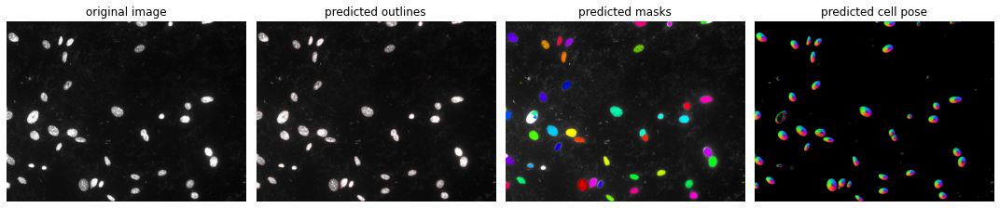

  3%|█▌                                          | 1/29 [00:02<01:04,  2.30s/it]

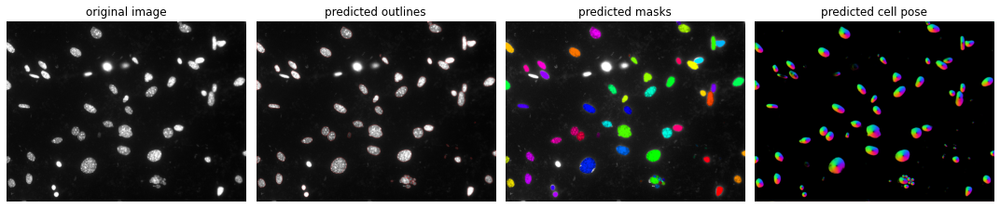

  7%|███                                         | 2/29 [00:04<01:02,  2.33s/it]

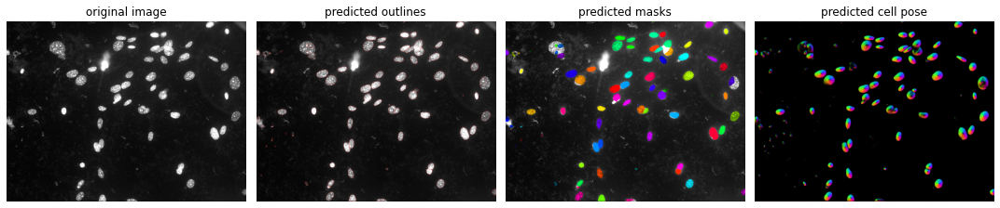

 10%|████▌                                       | 3/29 [00:06<00:59,  2.30s/it]

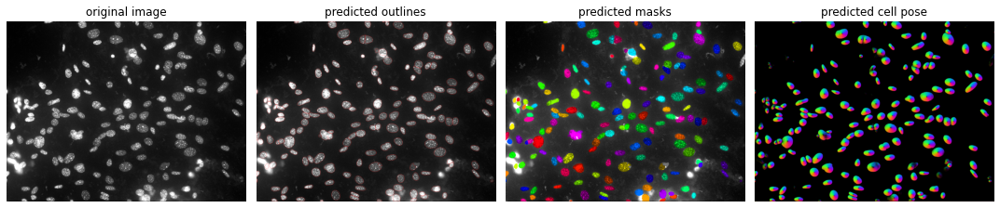

 14%|██████                                      | 4/29 [00:09<01:03,  2.53s/it]

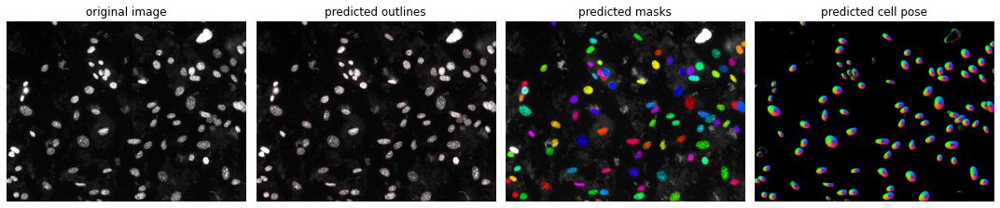

 17%|███████▌                                    | 5/29 [00:12<00:59,  2.47s/it]

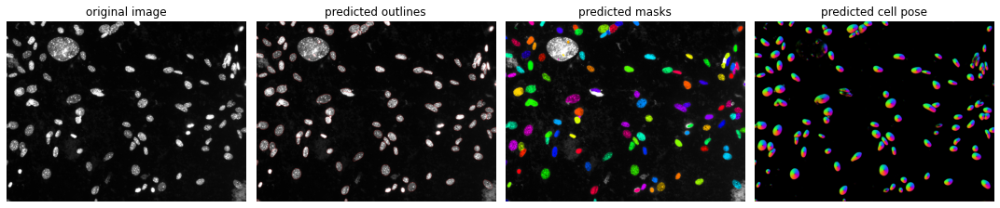

 21%|█████████                                   | 6/29 [00:14<00:57,  2.50s/it]

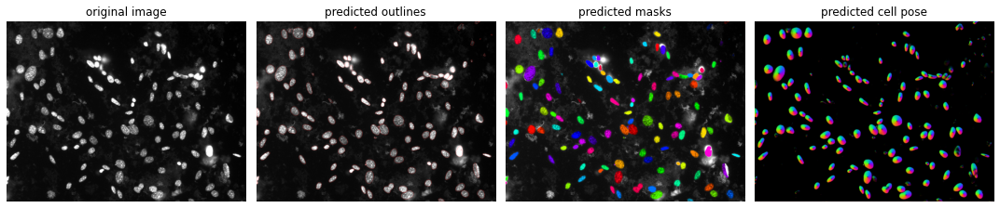

 24%|██████████▌                                 | 7/29 [00:17<00:55,  2.53s/it]

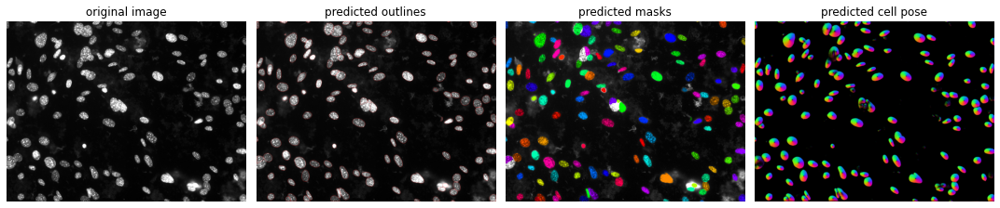

 28%|████████████▏                               | 8/29 [00:19<00:54,  2.58s/it]

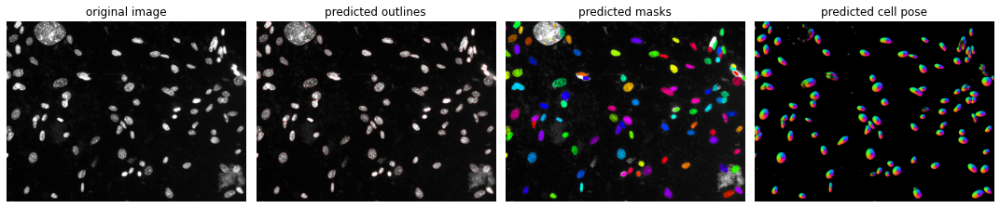

 31%|█████████████▋                              | 9/29 [00:22<00:51,  2.56s/it]

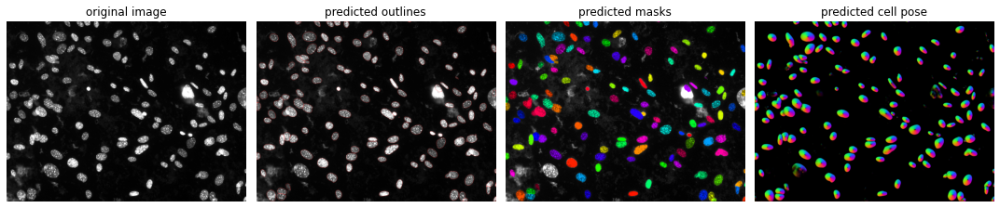

 34%|██████████████▊                            | 10/29 [00:25<00:49,  2.62s/it]

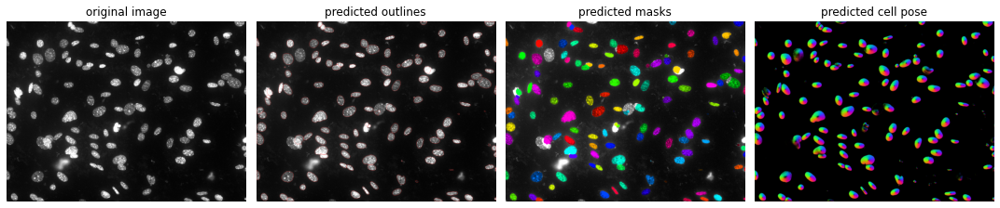

 38%|████████████████▎                          | 11/29 [00:27<00:46,  2.61s/it]

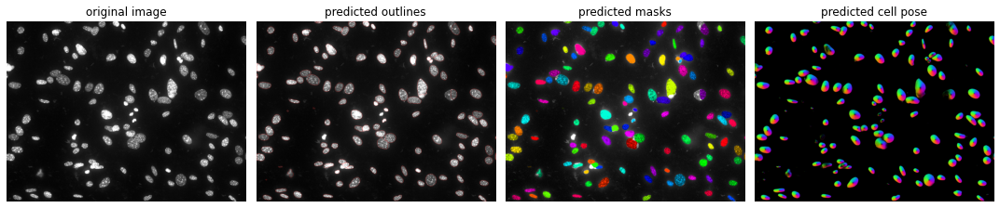

 41%|█████████████████▊                         | 12/29 [00:30<00:44,  2.60s/it]

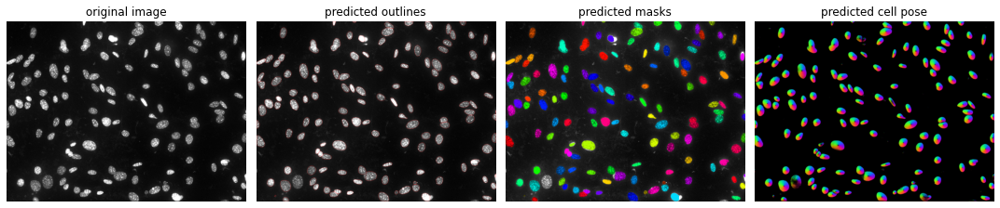

 45%|███████████████████▎                       | 13/29 [00:33<00:41,  2.62s/it]

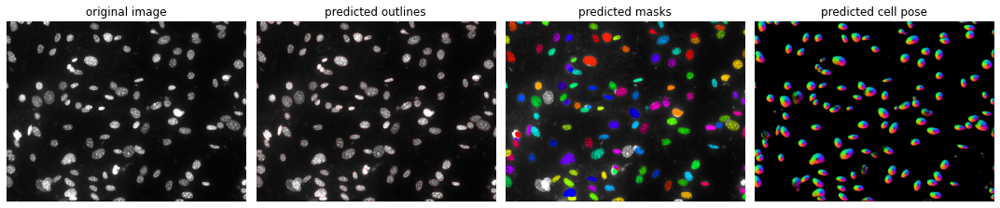

 48%|████████████████████▊                      | 14/29 [00:35<00:39,  2.63s/it]

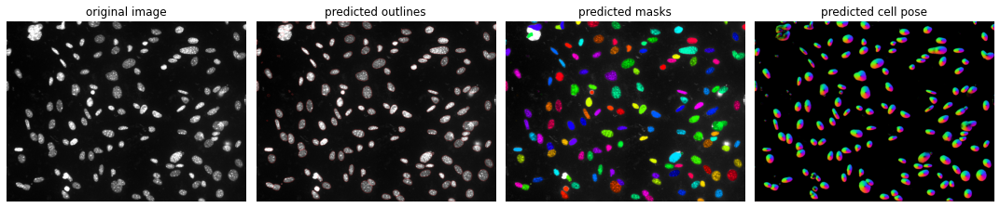

 52%|██████████████████████▏                    | 15/29 [00:38<00:37,  2.67s/it]

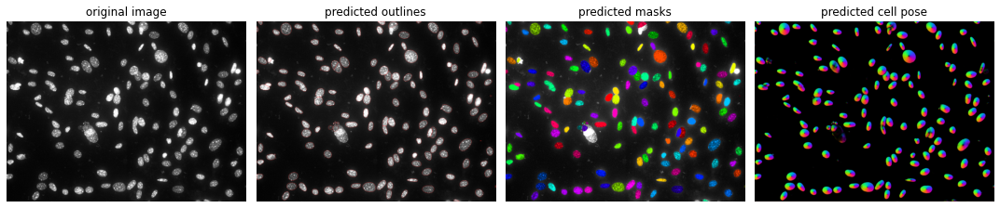

 55%|███████████████████████▋                   | 16/29 [00:41<00:34,  2.68s/it]

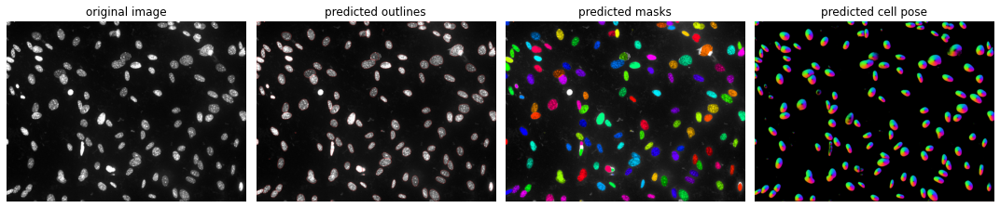

 59%|█████████████████████████▏                 | 17/29 [00:43<00:32,  2.67s/it]

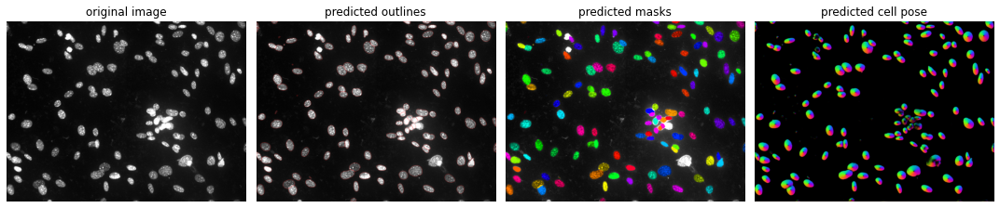

 62%|██████████████████████████▋                | 18/29 [00:46<00:29,  2.69s/it]

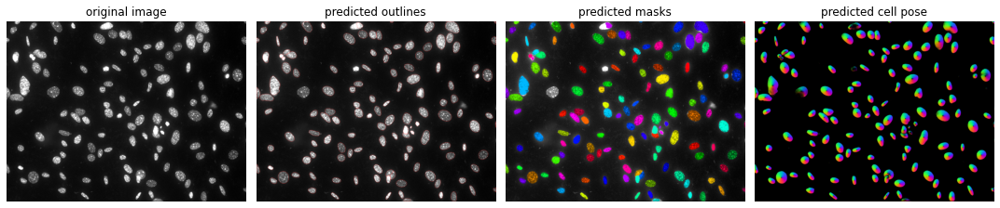

 66%|████████████████████████████▏              | 19/29 [00:49<00:26,  2.67s/it]

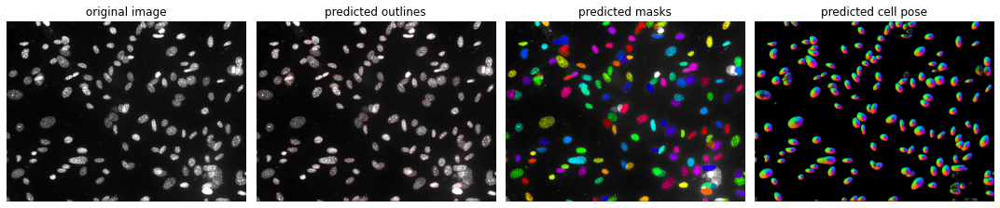

 69%|█████████████████████████████▋             | 20/29 [00:51<00:24,  2.70s/it]

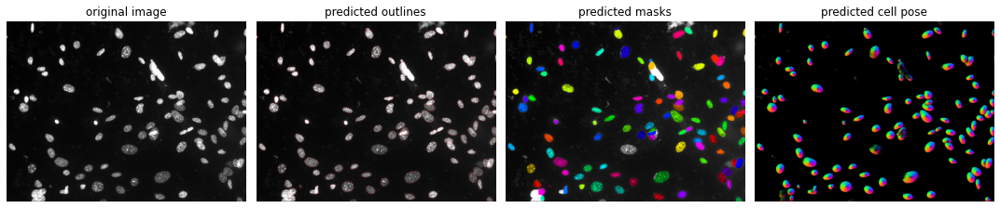

 72%|███████████████████████████████▏           | 21/29 [00:54<00:20,  2.62s/it]

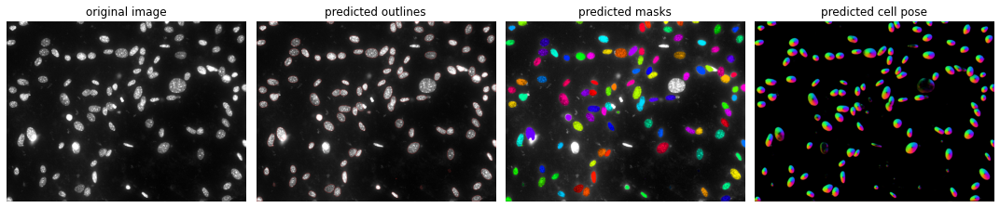

 76%|████████████████████████████████▌          | 22/29 [00:56<00:18,  2.58s/it]

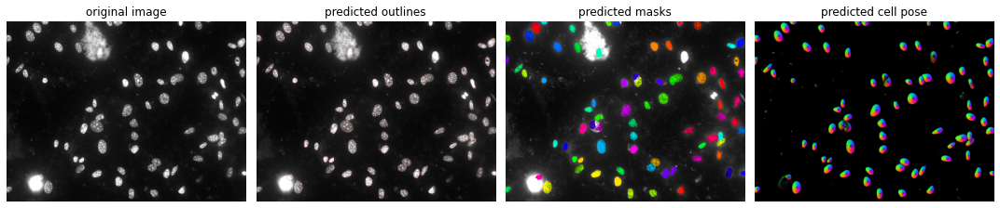

 79%|██████████████████████████████████         | 23/29 [00:59<00:14,  2.50s/it]

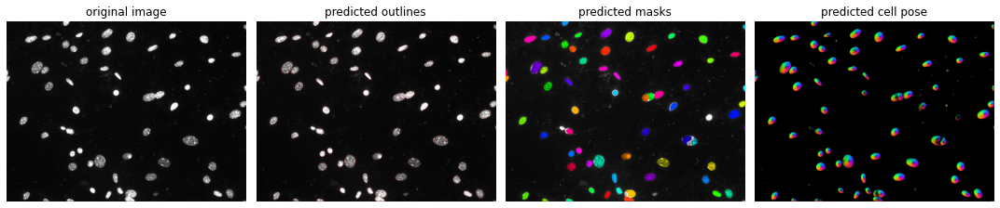

 83%|███████████████████████████████████▌       | 24/29 [01:01<00:12,  2.41s/it]

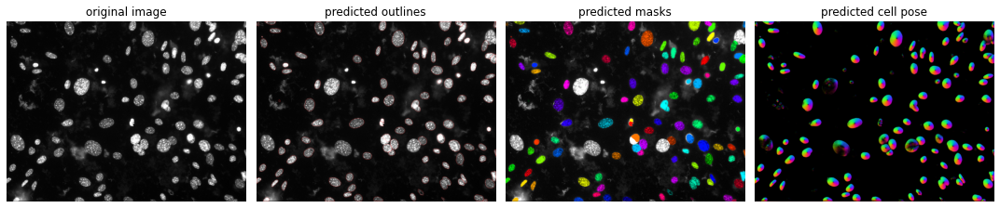

 86%|█████████████████████████████████████      | 25/29 [01:03<00:09,  2.42s/it]

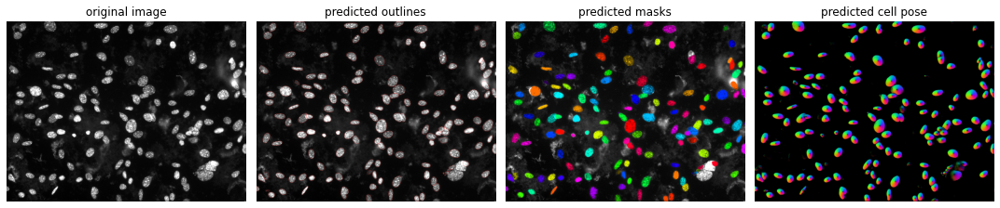

 90%|██████████████████████████████████████▌    | 26/29 [01:06<00:07,  2.52s/it]

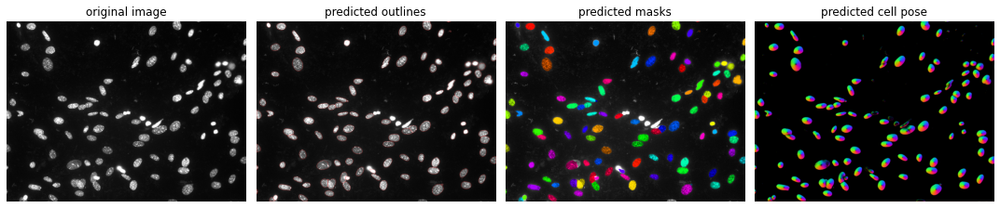

 93%|████████████████████████████████████████   | 27/29 [01:09<00:05,  2.50s/it]

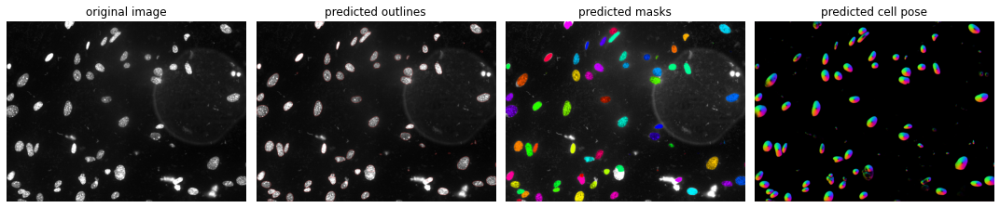

 97%|█████████████████████████████████████████▌ | 28/29 [01:11<00:02,  2.41s/it]

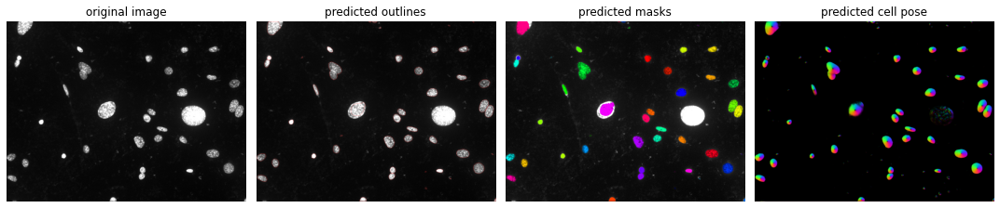

100%|███████████████████████████████████████████| 29/29 [01:13<00:00,  2.53s/it]


In [9]:
from tqdm import tqdm
import os

#os.mkdir(f"{ngs.path_save}figures/")

for f in tqdm(ngs.data["files"]):
    fig = ngs.show_segmentation(file = f)
    #fig.savefig(f"{ngs.path_save}figures/{f}_masks.pdf", dpi = 300)
    #plt.close()
    plt.show()

### Measure first pool of nuclear features

In [10]:
ngs.nuclear_features()

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  9.52it/s]


### Show distribution of nuclear features (optional)

Print the names of the features that we have measured so far...

In [11]:
ngs.print_features()

avg_intensity_dapi
nuclear_area
nuclear_perimeter
major_axis
minor_axis
axes_ratio
circularity
eccentricity
solidity
x_pos
y_pos
angle


We can plot any of the features measured by changing the parameter 'feature'.

In [12]:
fig = ngs.plot_boxplot_hist(feature = "nuclear_area")
fig.show()

### Measure additional nuclear features

Measure additional features. These can only be measured if the first pool has already been measured.

In [11]:
ngs.add_nuclear_features()

100%|█████████████████████████████████████████████| 1/1 [00:00<00:00,  5.75it/s]


In [14]:
ngs.data["files"]["Snap-360"]["nuclear_features"]["cellID"]

[3,
 4,
 5,
 6,
 7,
 8,
 9,
 10,
 11,
 12,
 13,
 14,
 15,
 16,
 17,
 18,
 19,
 20,
 21,
 22,
 23,
 25,
 27,
 28,
 29,
 31,
 32,
 33,
 34,
 36,
 37,
 38,
 39,
 40,
 41,
 43,
 44,
 45,
 46,
 47,
 48,
 49,
 50,
 51,
 52,
 53,
 54,
 55,
 56,
 57,
 58,
 59,
 60,
 61,
 62,
 63,
 64,
 65,
 66]

In [15]:
import numpy as np
a=[3,7,2,5,7,8]
b=[5,3]
np.where(b==a)

(array([], dtype=int64),)

Measure DNA dots and DNA peaks. This is an additional nuclear feature, whose measurement takes time. This feature finds the number of high intensity DNA dots in each nucleus.

In [12]:
ngs.find_dna_peaks(box_size = 10, zoom_box_size = 200)
ngs.find_dna_dots(zoom_box_size = 200)

  0%|                                                     | 0/1 [00:00<?, ?it/s]


IndexError: index 59 is out of bounds for axis 0 with size 59

Measure Leibovici's Spatial Entropy. This is an additional nuclear feature, whose measurement takes time. This feature calculates the spatial entropy of each nucleus using the Leibovici method. 

In [ ]:
ngs.spatial_entropy(d = 5, zoom_box_size = 200)

Print nuclear features measured:

In [ ]:
ngs.print_features()

### Identify cells positive to the markers

Another option is to use several thresholds and assign classes according to marker intensity:

In [ ]:
ngs.markerGroup(n_groups = 5, sample_size = 10) # A large sample size is time consuming.

### Save data and channel information for further NG analysis

In [ ]:
ngs.saveArrays()
ngs.saveChannelInfo()

### Export nuclear features measured as CSV

In [ ]:
ngs.export_csv(filename = "output.csv")